In [ ]:
from IPython.display import Audio
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
Audio("/content/Expert.wav")

In [ ]:
Audio("/content/student.wav")

In [ ]:
arr,sr = librosa.load("/content/Expert.wav")
Expert_audio=np.array(arr)
print(Expert_audio.shape,sr)
print(Expert_audio)

(141824,) 22050
[ 0.          0.          0.         ... -0.03448274 -0.03270171
 -0.03471576]


In [ ]:
arr,sr = librosa.load("/content/student.wav")
student_audio=np.array(arr)
print(student_audio.shape,sr)

(141824,) 22050


In [ ]:
plt.figure(figsize=(500,100))
plt.xlim(0,0.3)
librosa.display.waveplot(Expert_audio,sr=sr);

In [ ]:
plt.figure(figsize=(500,100))
plt.xlim(0,0.3)
librosa.display.waveplot(student_audio,sr=sr);

In [ ]:
Expert_max_dict={}
Expert_min_dict={}
student_max_dict={}
student_min_dict={}



In [ ]:
from librosa.util.utils import frame

FRAME_SIZE=256
HOP_LENGTH = 7
position1=[]
frame_size_array_max=[]

def amplitude_envelope_max(signal,FRAME_SIZE, hop_length):
    """Calculate the amplitude envelope of a signal with a given frame size nad hop length."""
    amplitude_envelope1 = []
    data_for_frame={}
    max_dict={}
    # calculate amplitude envelope for each frame
    for i in range(0, len(signal), hop_length): 
        amplitude_max= max(signal[i:i+hop_length])
        if amplitude_max >0: 
          position = np.where(signal == np.max(signal[i:i+hop_length]))
          if ((position[0][0] != i) and (position[0][0] != (i+hop_length))):
            amplitude_envelope1.append(amplitude_max)
            position1.append(position[0])
            time_pos=position[0]
            max_dict[time_pos[0]]=amplitude_max
            data_for_frame[time_pos[0]]=amplitude_max
            if i > FRAME_SIZE :
              FRAME_SIZE+=256
              frame_size_array_max.append([data_for_frame])
              data_for_frame={}

            
    return (np.array(amplitude_envelope1),max_dict)  





In [ ]:
FRAME_SIZE= 256
HOP_LENGTH = 7
frame_size_array_min=[]


def amplitude_envelope_min(signal, FRAME_SIZE, hop_length):
    """Calculate the amplitude envelope of a signal with a given frame size and hop length."""
    amplitude_envelope = []
    data_for_frame={}
    min_dict={}
    
    # calculate amplitude envelope for each frame
    for i in range(0, len(signal), hop_length): 
        
        amplitude_min= min(signal[i:i+hop_length]) 
        if amplitude_min <0:
          position = np.where(signal == np.min(signal[i:i+hop_length]))
          if ((position[0][0] != i) and (position[0][0] != (i+hop_length))):
            amplitude_envelope.append(amplitude_min)
            time_pos=position[0]
            min_dict[time_pos[0]]=amplitude_min
            data_for_frame[time_pos[0]]=amplitude_min
            if i > FRAME_SIZE :
              FRAME_SIZE+=256
              frame_size_array_min.append([data_for_frame])
              data_for_frame={}

            
    return (np.array(amplitude_envelope),min_dict)    




In [ ]:
Expert_max,Expert_max_dict = amplitude_envelope_max(Expert_audio, FRAME_SIZE,HOP_LENGTH)
student_max,student_max_dict = amplitude_envelope_max(student_audio, FRAME_SIZE,HOP_LENGTH)


In [ ]:
Expert_min,Expert_min_dict = amplitude_envelope_min(Expert_audio, FRAME_SIZE,HOP_LENGTH)
student_min,student_min_dict = amplitude_envelope_min(student_audio, FRAME_SIZE,HOP_LENGTH)

In [ ]:
print(Expert_max,"EXPERT")
print(student_max,"STUDENT")
print(Expert_min,"EXPERT")
print(student_min,"STUDENT")
print(Expert_max_dict,"EXPERT")
print(student_max_dict,"STUDENT")
print(Expert_min_dict,"EXPERT")
print(student_min_dict,"STUDENT")
print(len(student_max_dict))
print(len(Expert_max_dict))

[1.1318407e-11 1.7847790e-10 1.0247541e-09 ... 1.5014266e-02 1.5798861e-02
 1.7749807e-02] EXPERT
[2.8869971e-12 6.7294961e-11 1.3674891e-09 ... 3.4657605e-02 3.6935646e-02
 3.6265582e-02] STUDENT
[-1.9914214e-11 -1.5703501e-10 -5.6948746e-10 ... -2.6191618e-02
 -1.5699185e-02 -3.5393689e-02] EXPERT
[-4.0265295e-12 -1.2039811e-10 -1.0941665e-09 ... -3.1753566e-02
 -1.4397529e-02 -2.1171613e-02] STUDENT
{7733: 1.1318407e-11, 7741: 1.784779e-10, 7748: 1.0247541e-09, 7754: 7.171679e-09, 7758: 1.1890174e-08, 7769: 5.7912636e-08, 7775: 1.4457217e-07, 7790: 1.7372957e-06, 7793: 9.7649545e-06, 7799: 5.919762e-07, 7808: 1.4744109e-05, 7815: 3.7062289e-06, 7825: 3.868503e-06, 7828: 2.3389546e-05, 7837: 2.7508515e-05, 7842: 2.301295e-05, 7853: 3.2932647e-05, 7873: 2.0903535e-05, 7886: 2.5282243e-05, 7895: 7.549604e-05, 7921: 7.486881e-05, 7937: 0.000107020605, 7941: 0.00017479033, 7951: 8.7333814e-05, 7960: 2.8319448e-05, 7986: 0.0001627045, 7993: 0.00035219968, 8007: 5.6773864e-05, 8012: 0.0002

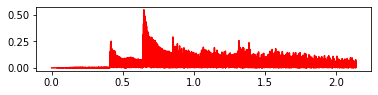

In [ ]:
frames_exp = range(len(Expert_max))
t_exp = librosa.frames_to_time(frames_exp, hop_length=HOP_LENGTH)
# amplitude envelope is graphed in red

ax = plt.subplot(3, 1, 1)
plt.plot(t_exp, Expert_max, color="r")

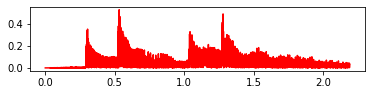

In [ ]:
frames_stu = range(len(student_max))
t_stu = librosa.frames_to_time(frames_stu, hop_length=HOP_LENGTH)
# amplitude envelope is graphed in red

ax = plt.subplot(3, 1, 1)
plt.plot(t_stu, student_max, color="r")

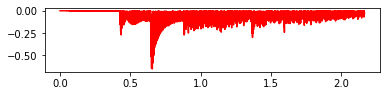

In [ ]:
frames = range(len(Expert_min))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)
# amplitude envelope is graphed in red

ax = plt.subplot(3, 1, 1)
plt.plot(t, Expert_min, color="r")

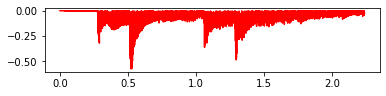

In [ ]:
frames_stu = range(len(student_min))

t = librosa.frames_to_time(frames_stu, hop_length=HOP_LENGTH)
# amplitude envelope is graphed in red

ax = plt.subplot(3, 1, 1)
plt.plot(t, student_min, color="r")

In [ ]:
def lagrange(max_dict,n1,n2,n3):
  ar11=(list(max_dict.keys()))
  y=np.array(ar11,float)
  ar22=(list(max_dict.values()))
  x=np.array(ar22,float)

  xplt=np.linspace(n1,n2,n3)
  xplt = xplt.astype(int)
  yplt=np.array([],float)

  for xp in xplt:
    yp=0
    for xi,yi in zip(x,y):
      yp+=yi*np.prod((xp-x[x!=xi])/(xi-x[x!=xi]))
    yplt=np.append(yplt,yp)

  plt.plot(x,y,"ro", xplt,yplt,'b-')
  plt.xlabel('x')
  plt.ylabel('y')
  plt.show()

  return (xplt,yplt)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in double_scalars
  


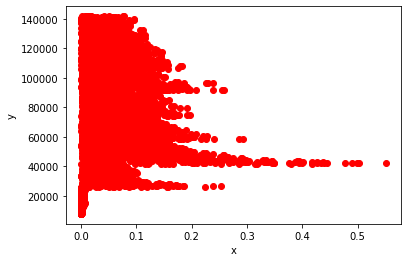

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in double_scalars
  


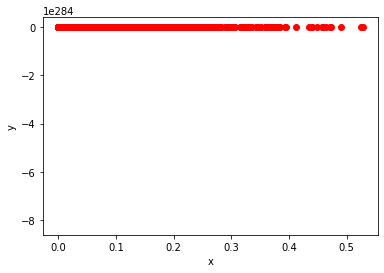

In [ ]:
Expert_x,Expert_y=lagrange(Expert_max_dict,0,len(Expert_max_dict),len(Expert_max_dict))
student_x,student_y=lagrange(student_max_dict,0,len(student_max_dict),len(student_max_dict))

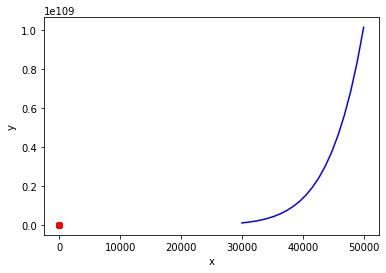

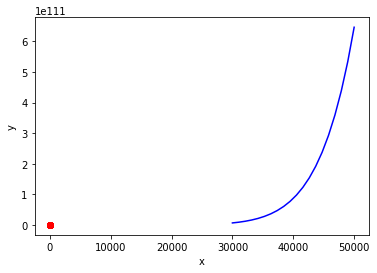

[30000 31052 32105 33157 34210 35263 36315 37368 38421 39473 40526 41578
 42631 43684 44736 45789 46842 47894 48947 50000]
[1.02380487e+107 1.39615004e+107 1.88486376e+107 2.51943385e+107
 3.33813245e+107 4.38529901e+107 5.71347502e+107 7.38966218e+107
 9.48951190e+107 1.21011629e+108 1.53366165e+108 1.93151574e+108
 2.41910978e+108 3.01319670e+108 3.73284747e+108 4.60231486e+108
 5.64735078e+108 6.89693107e+108 8.38804216e+108 1.01591164e+109]
[30000 31052 32105 33157 34210 35263 36315 37368 38421 39473 40526 41578
 42631 43684 44736 45789 46842 47894 48947 50000]
[6.51524171e+109 8.88475461e+109 1.19948082e+110 1.60330558e+110
 2.12430518e+110 2.79069616e+110 3.63591462e+110 4.70259880e+110
 6.03889138e+110 7.70088169e+110 9.75984456e+110 1.22916899e+111
 1.53946181e+111 1.91752408e+111 2.37549208e+111 2.92879969e+111
 3.59383478e+111 4.38903687e+111 5.33794320e+111 6.46501116e+111]


In [ ]:
import itertools 
out = dict(itertools.islice(Expert_max_dict.items(), 10))
out2= dict(itertools.islice(student_max_dict.items(), 10))
exp_sample_x,exp_sample_y=lagrange(out,30000,50000,20)
stu_sample_x,stu_sample_y=lagrange(out2,30000,50000,20)
print(exp_sample_x)
print(exp_sample_y)
print(stu_sample_x)
print(stu_sample_y)

(-0.9500000000000001, 19.95, -3.2314305850938727e+110, 6.788256599400237e+111)

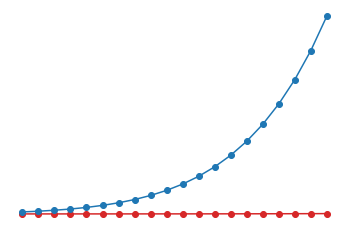

In [ ]:
# plotting the amplitude to look for the points of seperation
x = np.array(exp_sample_y)
y = np.array(stu_sample_y)

plt.figure(figsize=(6, 4))
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")

In [ ]:
# function to calculate the cost or seperation between 2 points
def dp(dist_mat):
    N, M = dist_mat.shape
    
    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from left to right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)


In [ ]:
# Distance matrix by calculating the distance of each point
N = x.shape[0]
M = y.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])

Alignment cost: 3.3832616266435918e+112
Normalized alignment cost: 8.458154066608979e+110


(-0.9500000000000001, 19.95, -3.2314305850938727e+110, 6.788256599400237e+111)

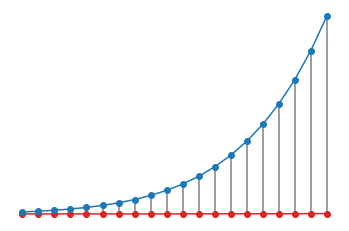

In [ ]:
path, cost_mat = dp(dist_mat)
c1=cost_mat[N - 1, M - 1]
c2=cost_mat[N - 1, M - 1]/(N + M)



print("Alignment cost: {}".format(c1))
print("Normalized alignment cost: {}".format(c2))
plt.figure()
for x_i, y_j in path:
    plt.plot([x_i, y_j], [x[x_i] + 1.5, y[y_j] - 1.5], c="C7")
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")

(-0.9500000000000001, 19.95, 28998.35, 51001.65)

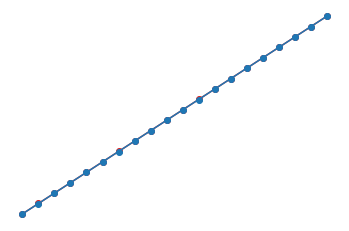

In [ ]:
x = np.array(exp_sample_x)
y = np.array(stu_sample_x)

plt.figure(figsize=(6, 4))
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")

In [ ]:
# Distance matrix
N = x.shape[0]
M = y.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])

Alignment cost: 0.0000
Normalized alignment cost: 0.0000


(-0.9500000000000001, 19.95, 28998.35, 51001.65)

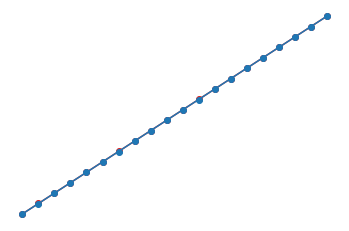

In [ ]:
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))
plt.figure()
for x_i, y_j in path:
    plt.plot([x_i, y_j], [x[x_i] + 1.5, y[y_j] - 1.5], c="C7")
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")